# Team Members


*   Fady Essam
*   Ahmed Hossam
*   Merna Abdullah
*   Menna-Allah Ahmed





#Imports

In [6]:
import os
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, GlobalMaxPool2D
from keras.layers import Dense
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras.models import load_model
from google.colab.patches import cv2_imshow

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Global values

In [8]:
scaler = StandardScaler()

# Data Preparation

## Counts the number of image files

In [9]:
import os

def count_images(folder_path):
    """
    Counts the number of image files with '.jpg' or '.png' extensions in the 'Train' and 'Validation' subdirectories.

    Parameters:
    - folder_path (str): The path to the parent folder containing 'Train' and 'Validation' subdirectories.

    Returns:
    - tuple: A tuple containing the count of images in the 'Train' and 'Validation' directories, respectively.
    """
    train_path = os.path.join(folder_path, 'Train')
    validation_path = os.path.join(folder_path, 'Validation')

    # os.listdir function to get the list of files in the specified subdirectories.
    train_images = [f for f in os.listdir(train_path) if f.endswith('.jpg') or f.endswith('.png')]
    validation_images = [f for f in os.listdir(validation_path) if f.endswith('.jpg') or f.endswith('.png')]
    return len(train_images), len(validation_images)


def print_shapes(data_path, task):
    """
    Prints the count of images in the 'Train' and 'Validation' directories for each class in the specified data path.

    Parameters:
    - data_path (str): The path to the parent folder containing class subdirectories.
    - task (str): A description of the task (e.g., 'Object Recognition', 'Classification').

    Prints:
    - For each class, the number of images in the 'Train' and 'Validation' directories.
    - Total number of training and validation images across all classes.
    """
    total_train_count = 0
    total_validation_count = 0

    print(f"{task} Data:")
    for class_folder in os.listdir(data_path):
        class_path = os.path.join(data_path, class_folder)
        if os.path.isdir(class_path):
            train_count, validation_count = count_images(class_path)
            total_train_count += train_count
            total_validation_count += validation_count

            print(f"Class {class_folder}:")
            print(f"Train Images: {train_count}")
            print(f"Validation Images: {validation_count}")
            print()

    print("\nTotal:")
    print(f"Total Train Images: {total_train_count}")
    print(f"Total Validation Images: {total_validation_count}")


In [10]:
# /content/drive/MyDrive/Product Classification
classification_data_path = "/content/drive/MyDrive/Product Classification"
print_shapes(classification_data_path, "Classification")

Classification Data:
Class 1:
Train Images: 11
Validation Images: 3

Class 13:
Train Images: 6
Validation Images: 2

Class 11:
Train Images: 7
Validation Images: 2

Class 12:
Train Images: 7
Validation Images: 2

Class 10:
Train Images: 6
Validation Images: 2

Class 14:
Train Images: 6
Validation Images: 2

Class 18:
Train Images: 7
Validation Images: 1

Class 3:
Train Images: 8
Validation Images: 2

Class 20:
Train Images: 6
Validation Images: 1

Class 16:
Train Images: 7
Validation Images: 1

Class 4:
Train Images: 6
Validation Images: 2

Class 15:
Train Images: 6
Validation Images: 2

Class 17:
Train Images: 7
Validation Images: 1

Class 19:
Train Images: 6
Validation Images: 1

Class 2:
Train Images: 8
Validation Images: 2

Class 5:
Train Images: 6
Validation Images: 2

Class 6:
Train Images: 9
Validation Images: 0

Class 7:
Train Images: 7
Validation Images: 2

Class 8:
Train Images: 7
Validation Images: 2

Class 9:
Train Images: 7
Validation Images: 2


Total:
Total Train Images:

 ## Preprocesses an image using data augmentation only (no sift).

In [11]:
def preprocess_image_train(image_path):
    """
    Preprocesses an image using various techniques.

    Parameters:
    - image_path (str): The path to the input image file.

    Returns:
    - list: List of preprocessed images.
    """

    original_image = cv2.imread(image_path)

    if original_image is None:
        print(f"Error: Unable to read the image at {image_path}")
        return None

    # Resize the image to (224, 224)
    resized_image = cv2.resize(original_image, (224, 224))
    print(f"Resized image shape: {resized_image.shape}")

    # Normalization
    normalized_image = resized_image.astype(np.float32) / 255.0
    normalized_image = (normalized_image - 0.5) / 0.5  # Standardize to have mean=0 and std=1

    augmented_images = [normalized_image]

    # Data augmentation
    resized_image_flipped = cv2.flip(normalized_image, 1)
    augmented_images.append(resized_image_flipped)

    angle = np.random.uniform(-30, 30)
    rotation_matrix = cv2.getRotationMatrix2D((normalized_image.shape[1] / 2, normalized_image.shape[0] / 2), angle, 1.0)
    resized_image_rotated = cv2.warpAffine(normalized_image, rotation_matrix,
                                           (normalized_image.shape[1], normalized_image.shape[0]))
    augmented_images.append(resized_image_rotated)

    kernel_size = (5, 5)
    resized_image_blurred = cv2.GaussianBlur(normalized_image, kernel_size, 0)
    augmented_images.append(resized_image_blurred)

    # # Display the original and augmented images
    # plt.figure(figsize=(15, 5))
    # for i, augmented_image in enumerate(augmented_images):
    #     plt.subplot(1, 5, i + 1)
    #     plt.imshow(cv2.cvtColor((augmented_image + 0.5) * 255, cv2.COLOR_BGR2RGB).astype(np.uint8))
    #     plt.title(f'Augmented Image {i + 1}')

    # plt.show()

    return augmented_images

In [12]:

def preprocess_image_val(image_path):
    """
    Preprocesses an image using various techniques.

    Parameters:
    - image_path (str): The path to the input image file.

    Returns:
    - np.ndarray: The preprocessed image.
    """
    original_image = cv2.imread(image_path)

    if original_image is None:
        print(f"Error: Unable to read the image at {image_path}")
        return None

    # Resize the image to (224, 224)
    resized_image = cv2.resize(original_image, (224, 224))
    print(f"Resized image shape: {resized_image.shape}")

    # Normalization
    normalized_image = resized_image.astype(np.float32) / 255.0
    normalized_image = (normalized_image - 0.5) / 0.5  # Standardize to have mean=0 and std=1

    return normalized_image

In [13]:
def preprocess_images_in_folder_train(folder_path):
    """
    Preprocesses a collection of images in a folder using data augmentation.

    Parameters:
    - folder_path (str): The path to the folder containing input images.

    Returns:
    - list: List of preprocessed images for each image in the folder.
    """
    preprocessed_images = []

    # Counter for the number of folders
    num_folders = 0

    for root, _, files in os.walk(folder_path):
        for image_file in files:
            image_path = os.path.join(root, image_file)

            print("=" * 50)
            print(f"Processing image: {image_path}")

            preprocessed_image = preprocess_image_train(image_path)
            preprocessed_images.extend(preprocessed_image)

        # Increment the number of folders
        num_folders += 1

    print(f"Number of folders processed: {num_folders}")
    print("Done processing images in the folder.")
    print("=" * 50)
    return preprocessed_images


In [14]:
def preprocess_images_in_folder_val(folder_path):
    preprocessed_images = []

    for root, _, files in os.walk(folder_path):
        for image_file in files:
            image_path = os.path.join(root, image_file)

            print("=" * 50)
            print(f"Processing image: {image_path}")

            preprocessed_image = preprocess_image_val(image_path)
            preprocessed_images.append(preprocessed_image)  # Append to the list instead of extending

    print("Done processing images in the folder.")
    print("=" * 50)
    return preprocessed_images

## Preprocesses classification data with data augmentation only.


In [15]:
def preprocess_classification_data(data_path, data_type):
    preprocessed_data = []

    for class_folder in os.listdir(data_path):
        class_path = os.path.join(data_path, class_folder, data_type)

        if os.path.exists(class_path):
            # Extract numeric class label from the folder name
            class_label = class_folder

            print(f"Processing {data_type} data for Class {class_label}")

            if data_type == "Train":
                preprocessed_images_class = preprocess_images_in_folder_train(class_path)
            elif data_type == "Validation":
                preprocessed_images_class = preprocess_images_in_folder_val(class_path)

            # Append the preprocessed images along with their class labels to preprocessed_data
            preprocessed_data.extend([(preprocessed_image, class_label) for preprocessed_image in preprocessed_images_class])

            print(f"Total processed images for Class {class_label}: {len(preprocessed_images_class)}")

    return preprocessed_data

In [16]:
# getting data ready for Deep Learning model
classification_data_path = "/content/drive/MyDrive/Product Classification"

preprocessed_data_train = preprocess_classification_data(classification_data_path, "Train")
preprocessed_data_val = preprocess_classification_data(classification_data_path, "Validation")

Processing Train data for Class 1
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web6.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web4.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web9.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web7.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web8.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web3.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web1.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDrive/Product Classification/1/Train/web5.png
Resized image shape: (224, 224, 3)
Processing image: /content/drive/MyDri

# Classification Models

## Model 1

In [17]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
import time
def create_cnn_model(input_shape, num_classes):
    model = models.Sequential()
    # Convolutional layers
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(Conv2D(256, (3, 3)))
    model.add(GlobalMaxPool2D())
    model.add(Dense(256, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(16, activation='relu'))

    model.add(layers.Dropout(0.5))  # Dropout for regularization
    model.add(layers.Dense(num_classes, activation='softmax'))  # Output layer with softmax activation

    return model

input_shape = (224, 224, 3)
num_classes = 20
model = create_cnn_model(input_shape, num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

classification_data_path = "/content/drive/MyDrive/Product Classification"


preprocessed_data_train = preprocess_classification_data(classification_data_path, "Train")

# Extract images and labels from the preprocessed training data
train_images, train_labels = zip(*preprocessed_data_train)
# train_labels = [label - 1 for label in train_labels]
train_images = np.array(train_images)
train_labels = np.array(train_labels, dtype=np.int32)


preprocessed_data_val = preprocess_classification_data(classification_data_path, "Validation")

# Extract images and labels from the preprocessed validation data
val_images, val_labels = zip(*preprocessed_data_val)
# val_labels = [label - 1 for label in val_labels]
val_images = np.array(val_images)
val_labels = np.array(val_labels, dtype=np.int32)


from tensorflow.keras.utils import to_categorical
train_labels_one_hot = to_categorical(train_labels - 1, num_classes=num_classes)
val_labels_one_hot = to_categorical(val_labels - 1, num_classes=num_classes)

# Training
start_time = time.time()
model.fit(train_images, train_labels_one_hot, epochs=200, batch_size=32, validation_data=(val_images, val_labels_one_hot))
end_time = time.time()
training_time = end_time - start_time
print(f"Training Time: {training_time} seconds")

# Testing
start_time = time.time()
test_loss, test_accuracy = model.evaluate(val_images, val_labels_one_hot)
end_time = time.time()
testing_time = end_time - start_time
print(f"Testing Time: {testing_time} seconds")

# Save the model
model.save("/content/drive/MyDrive/classification_deep_model")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

In [18]:
predictions = model.predict(val_images)
for i in range(len(val_images)):
    print(f"Sample {i + 1}:")
    # print(f"Predicted class probabilities: {predictions[i]}")

    # Adjust the indices by adding 1
    predicted_class = np.argmax(predictions[i]) + 1
    print(f"Predicted class: {predicted_class}")

    # Adjust the true labels as well
    true_class = np.argmax(val_labels_one_hot[i]) + 1
    print(f"True class: {true_class}")
    print("\n")

    # predicted_class_probability = np.max(predictions[i])
    # print(f"Predicted class probability: {predicted_class_probability:.4f}")

    # predicted_probabilities_list = predictions[i].tolist()
    # print("Predicted class probabilities:", predicted_probabilities_list)


2/2 [==============================] - 0s 16ms/step
Sample 1:
Predicted class: 1
True class: 1


Sample 2:
Predicted class: 1
True class: 1


Sample 3:
Predicted class: 1
True class: 1


Sample 4:
Predicted class: 13
True class: 13


Sample 5:
Predicted class: 13
True class: 13


Sample 6:
Predicted class: 11
True class: 11


Sample 7:
Predicted class: 11
True class: 11


Sample 8:
Predicted class: 12
True class: 12


Sample 9:
Predicted class: 12
True class: 12


Sample 10:
Predicted class: 10
True class: 10


Sample 11:
Predicted class: 10
True class: 10


Sample 12:
Predicted class: 14
True class: 14


Sample 13:
Predicted class: 14
True class: 14


Sample 14:
Predicted class: 18
True class: 18


Sample 15:
Predicted class: 3
True class: 3


Sample 16:
Predicted class: 3
True class: 3


Sample 17:
Predicted class: 20
True class: 20


Sample 18:
Predicted class: 16
True class: 16


Sample 19:
Predicted class: 4
True class: 4


Sample 20:
Predicted class: 4
True class: 4


Sample 21:


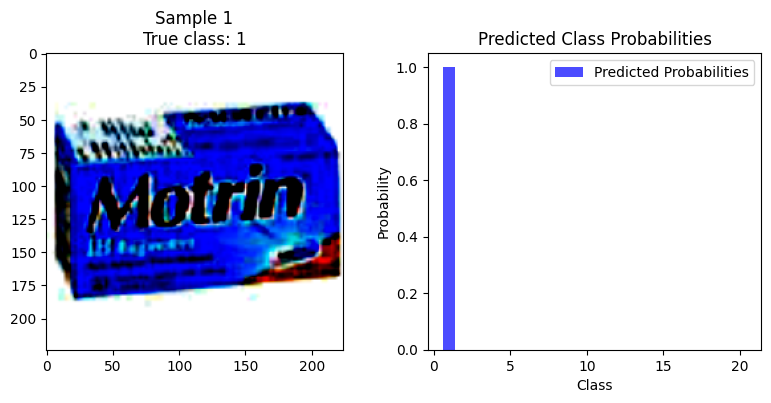

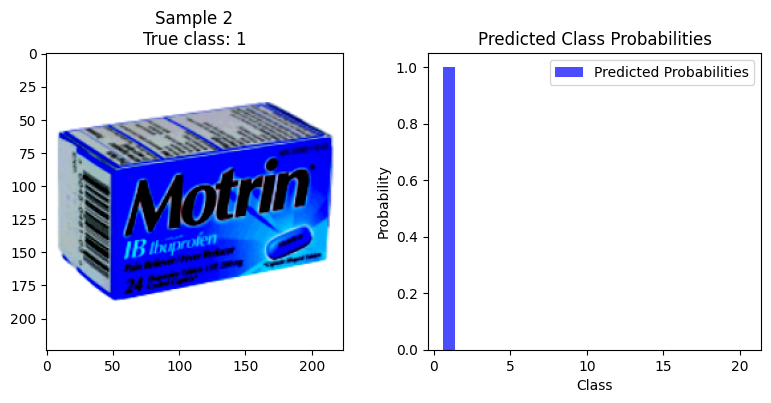

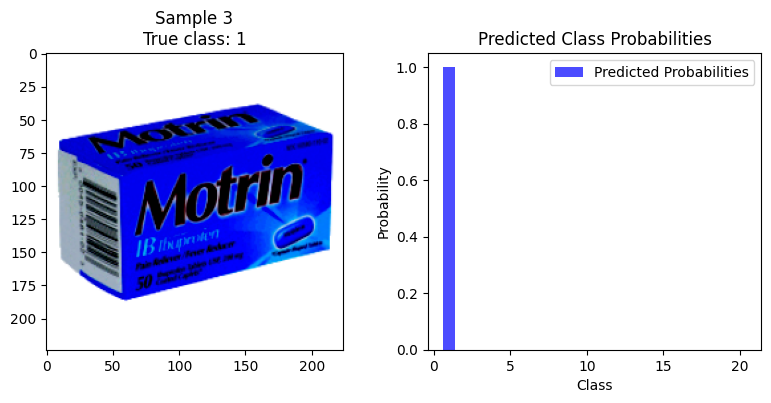

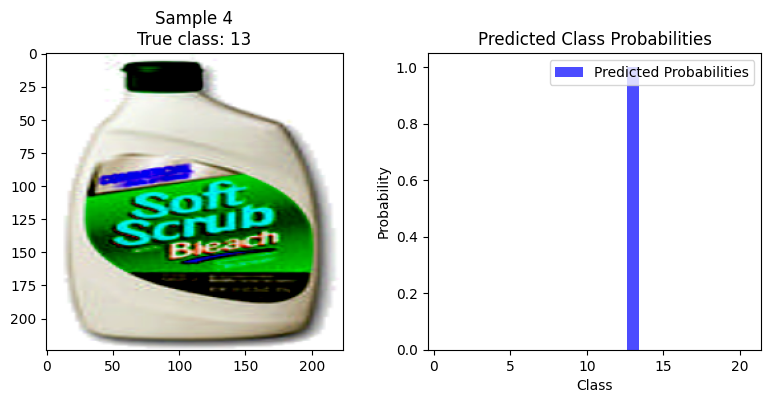

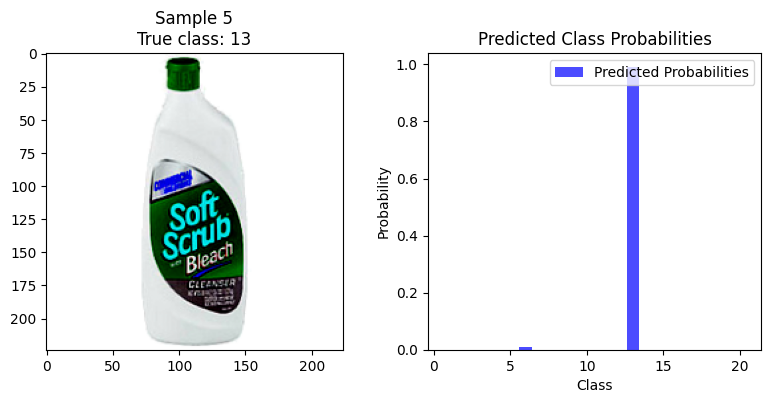

...

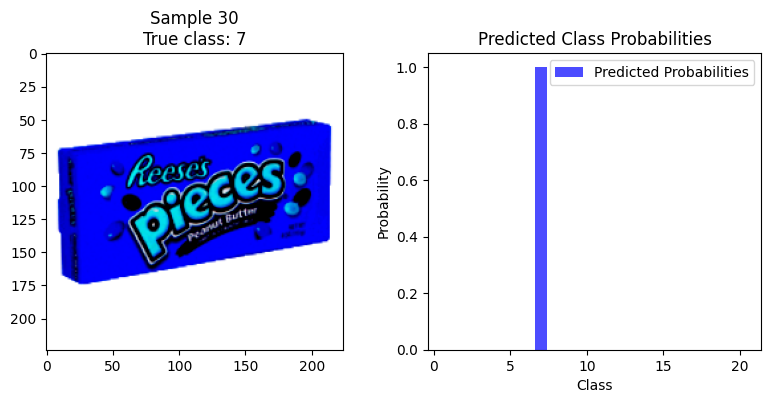

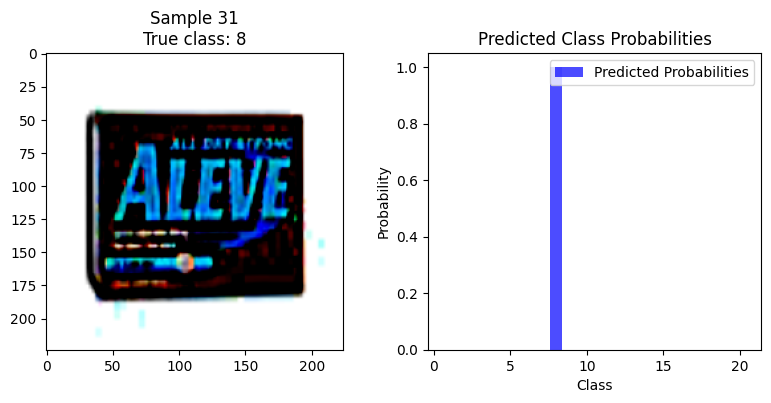

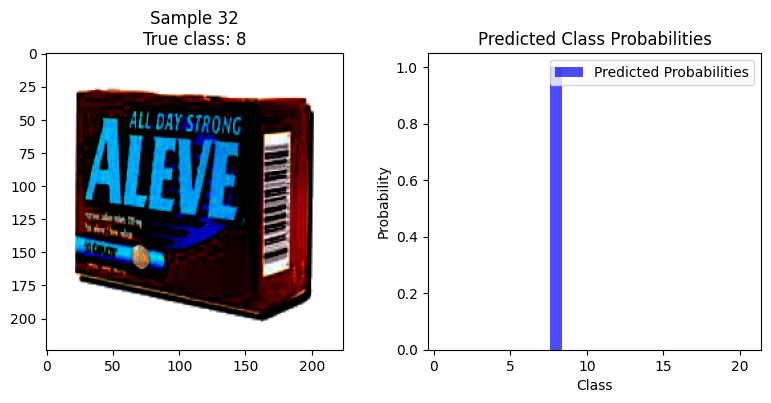

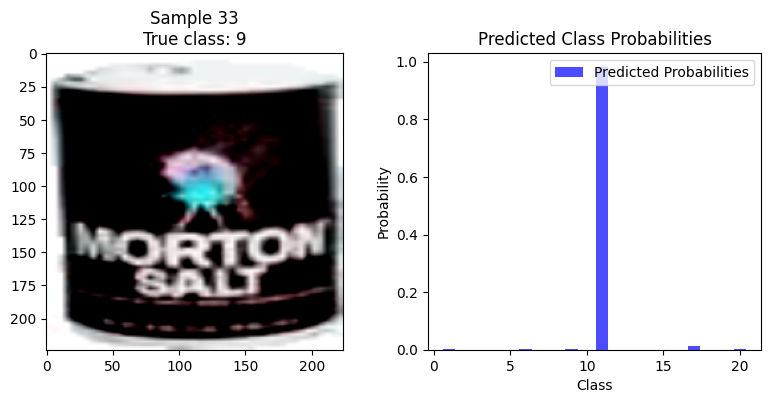

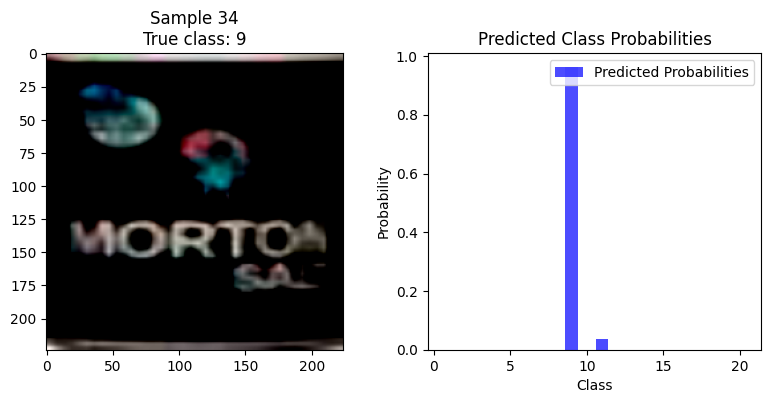

In [19]:
import matplotlib.pyplot as plt

# Assuming predictions, val_images, and val_labels are already defined
for i in range(len(val_images)):
    plt.figure(figsize=(8, 4))

    # Display the image (assuming it's an RGB image)
    plt.subplot(1, 2, 1)
    plt.imshow(val_images[i])
    plt.title(f"Sample {i + 1}\nTrue class: {val_labels[i]}")

    # Display the bar chart of predicted probabilities
    plt.subplot(1, 2, 2)
    classes = np.arange(1, num_classes + 1)  # Assuming classes are indexed from 1 to num_classes
    plt.bar(classes, predictions[i], color='blue', alpha=0.7, label='Predicted Probabilities')
    plt.xlabel('Class')
    plt.ylabel('Probability')
    plt.title('Predicted Class Probabilities')
    plt.legend()

    plt.tight_layout()
    plt.show()


## Model 2

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split

def create_cnn_model(input_shape, num_classes):
    model = models.Sequential()

    # Convolutional layers
    model.add(layers.Conv2D(500, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(400, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.Conv2D(300, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(Conv2D(200, (3, 3)))
    model.add(GlobalMaxPool2D())
    model.add(Dense(100, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(40, activation='relu'))
    model.add(Dense(30, activation='relu'))
    model.add(Dense(20, activation='relu'))

    model.add(layers.Dropout(0.5))  # Dropout for regularization
    model.add(layers.Dense(num_classes, activation='softmax'))  # Output layer with softmax activation

    return model

input_shape = (224, 224, 3)
num_classes = 20
model = create_cnn_model(input_shape, num_classes)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

classification_data_path = "/content/drive/MyDrive/Product Classification"


preprocessed_data_train = preprocess_classification_data(classification_data_path, "Train")

# Extract images and labels from the preprocessed training data
train_images, train_labels = zip(*preprocessed_data_train)
# train_labels = [label - 1 for label in train_labels]
train_images = np.array(train_images)
train_labels = np.array(train_labels, dtype=np.int32)


preprocessed_data_val = preprocess_classification_data(classification_data_path, "Validation")

# Extract images and labels from the preprocessed validation data
val_images, val_labels = zip(*preprocessed_data_val)
# val_labels = [label - 1 for label in val_labels]
val_images = np.array(val_images)
val_labels = np.array(val_labels, dtype=np.int32)


from tensorflow.keras.utils import to_categorical
train_labels_one_hot = to_categorical(train_labels - 1, num_classes=num_classes)
val_labels_one_hot = to_categorical(val_labels - 1, num_classes=num_classes)

# Training
start_time = time.time()
model.fit(train_images, train_labels_one_hot, epochs=200, batch_size=32, validation_data=(val_images, val_labels_one_hot))
end_time = time.time()
training_time = end_time - start_time
print(f"Training Time: {training_time} seconds")

# Testing
start_time = time.time()
test_loss, test_accuracy = model.evaluate(val_images, val_labels_one_hot)
end_time = time.time()
testing_time = end_time - start_time
print(f"Testing Time: {testing_time} seconds")

# Save the model
model.save("/content/drive/MyDrive/Product Classification/model_final_999.h5")

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 222, 222, 500)     14000     
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 111, 111, 500)     0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 109, 109, 400)     1800400   
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 54, 54, 400)       0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 52, 52, 300)       1080300   
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 26, 26, 300)      

# Testing Script

#### Preprocess an image

In [20]:

def preprocess_image_testscript_d(image_path):
    """
    Preprocesses an image using various techniques.

    Parameters:
    - image_path (str): The path to the input image file.

    Returns:
    - np.ndarray: The preprocessed image.
    """
    original_image = cv2.imread(image_path)

    if original_image is None:
        print(f"Error: Unable to read the image at {image_path}")
        return None

    # Resize the image to (224, 224)
    resized_image = cv2.resize(original_image, (224, 224))
    print(f"Resized image shape: {resized_image.shape}")

    resized_image = np.expand_dims(resized_image, axis=0)

    # Normalization
    normalized_image = resized_image.astype(np.float32) / 255.0
    normalized_image = (normalized_image - 0.5) / 0.5  # Standardize to have mean=0 and std=1

    return normalized_image

#### testscript

Prediction for Class 3
Predicting image (web1.png) class
Resized image shape: (224, 224, 3)
1/1 [==============================] - 1s 507ms/step


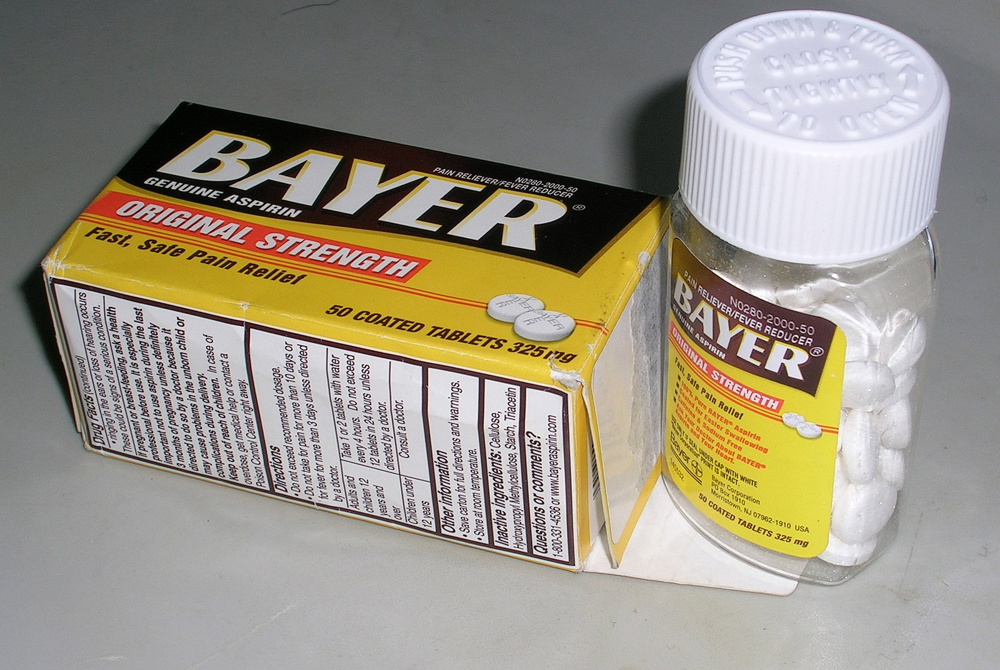

The Predicted Image Class is 6
Predicting image (web2.png) class
Resized image shape: (224, 224, 3)
1/1 [==============================] - 0s 46ms/step


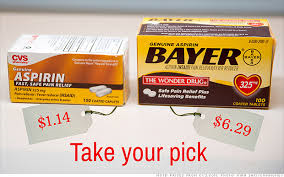

The Predicted Image Class is 15
Predicting image (web3.png) class
Resized image shape: (224, 224, 3)
1/1 [==============================] - 0s 25ms/step


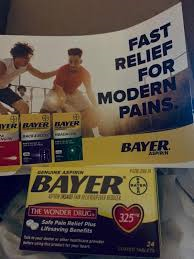

The Predicted Image Class is 11
Done predicting images in the folder.
Prediction for Class 2
Predicting image (web1.png) class
Resized image shape: (224, 224, 3)
1/1 [==============================] - 0s 28ms/step


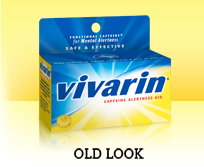

The Predicted Image Class is 2
Done predicting images in the folder.
Prediction for Class 1
Predicting image (web1.png) class
Resized image shape: (224, 224, 3)
1/1 [==============================] - 0s 31ms/step


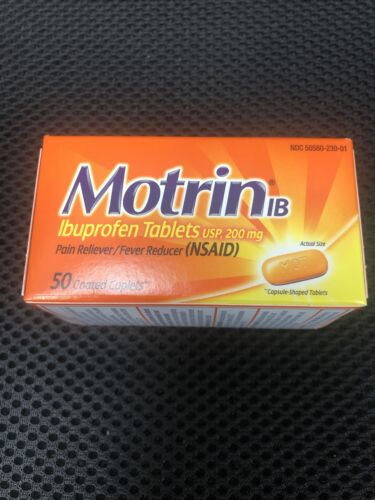

The Predicted Image Class is 4
Predicting image (web2.png) class
Resized image shape: (224, 224, 3)
1/1 [==============================] - 0s 19ms/step


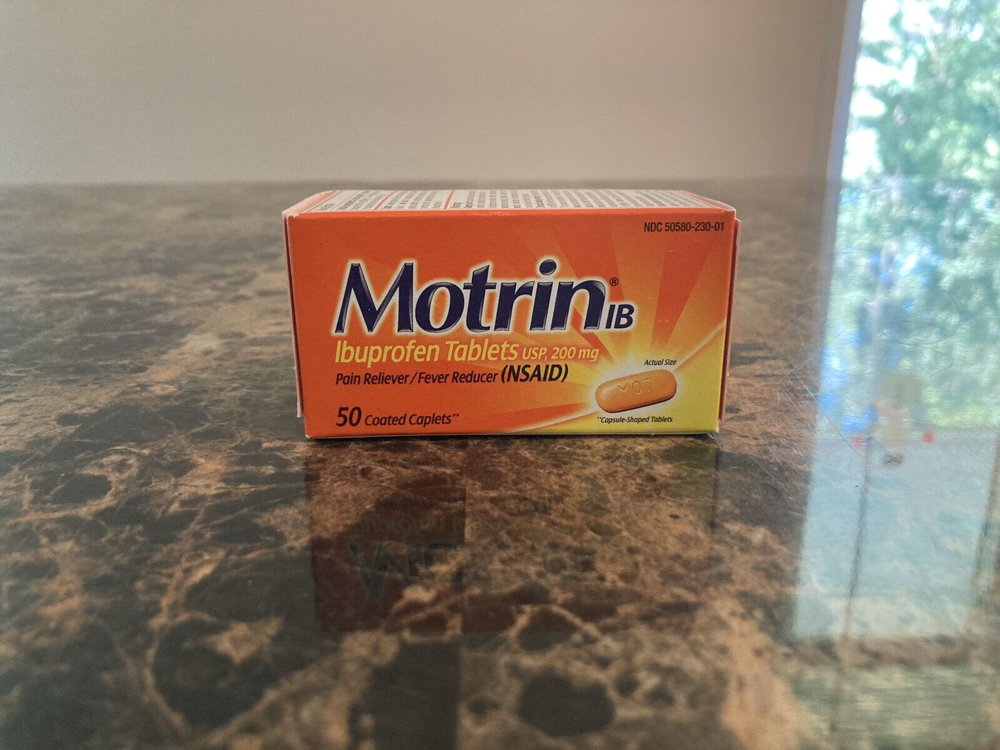

The Predicted Image Class is 17
Done predicting images in the folder.
Prediction for Class 4
Done predicting images in the folder.
Total Accuracy is 16.666666666666664 %


In [21]:
# The path to the testing images folder
testing_folder_path_d = "/content/drive/MyDrive/test samples class"

# The path to the pre-trained model
model_path_d = "/content/drive/MyDrive/classification_deep_model"

# Load the pre-trained model
model_d = load_model(model_path_d)

total_images_num_d = 0
correct_pred_d = 0
accuracy_d = 0

for class_folder_d in os.listdir(testing_folder_path_d):
    class_path_d = os.path.join(testing_folder_path_d, class_folder_d)

    if os.path.exists(class_path_d):
        # Extract numeric class label from the folder name
        class_label_d = int(class_folder_d)

        print(f"Prediction for Class {class_label_d}")
        print("=" * 50)

        for root_d, _, images_d in os.walk(class_path_d):
            for image_d in images_d:
                image_path_d = os.path.join(root_d, image_d)

                print(f"Predicting image ({image_d}) class")
                print("=" * 25)

                try:
                    total_images_num_d += 1

                    # preprocessing the test data
                    preprocessed_image_d = preprocess_image_testscript_d(image_path_d)

                    # Make predictions on the validation set
                    predictions_d = model_d.predict(preprocessed_image_d)

                    # Get the predicted labels
                    predicted_label_d = np.argmax(predictions_d) + 1

                    if predicted_label_d == class_label_d:
                        correct_pred_d += 1

                    # Display the image and print the prediction
                    testing_image_d = cv2.imread(image_path_d)
                    cv2_imshow(testing_image_d)
                    print(f"The Predicted Image Class is {predicted_label_d}")
                    print("=" * 10)

                except Exception as e:
                    print(f"Error processing image {image_path_d}: {e}")

        print("Done predicting images in the folder.")
        print("=" * 100)

    else:
        print(f"Error: {class_path_d} does not exist.")

accuracy_d = (correct_pred_d / total_images_num_d) * 100

print(f"Total Accuracy is {accuracy_d} %")
